(ellipsoid-shape-show)=

# Superellipsoids with Different Shape Parameters

The examples below illustrate how different shape parameters affect the geometry of a generalized ellipsoid.

A generalized ellipsoid is described by the following equation:

$$
f(x,y,z) \;=\; \Bigl[\Bigl(\frac{x}{a}\Bigr)^2\Bigr]^{S_a}
+\Bigl[\Bigl(\frac{y}{b}\Bigr)^2\Bigr]^{S_b}
+\Bigl[\Bigl(\frac{z}{c}\Bigr)^2\Bigr]^{S_c}
$$

where $a$, $b$, and $c$ are the semi-axis lengths along the $x$-, $y$-, and $z$-axes, respectively.  
$S_a$, $S_b$, and $S_c$ are the shape indices along the three axes.  
We also define the three ellipticities as
$\varepsilon_{ab} = 1 - \frac{b}{a}$,
$\varepsilon_{ac} = 1 - \frac{c}{a}$,
and
$\varepsilon_{bc} = 1 - \frac{c}{b}$.

## Initializing the Shape

Here we mainly use the `StructureCore` class, which integrates coordinate transformations ({py:class}`CoordinateBase <gal3d.shape.coordinate.CoordinateBase>`) and geometry generation ({py:class}`GeometryBase <gal3d.shape.geometry.GeometryBase>`). By setting different parameters, you can generate different three-dimensional shapes.

You can inspect all available initialization options using `StructureCore.available_options()`.

In [1]:
from gal3d.shape import StructureCore
StructureCore.available_options()

{'coordinate': ['EulerShift', 'RotateOnly', 'ShiftEuler', 'ShiftOnly'],
 'geometry': ['Ellipsoid', 'Ellipsoid_S']}

We choose `EulerShift` as the coordinate transformation and `Ellipsoid_S` as the geometry. As you can see, `shape.parameters` contains 12 parameters. In this tutorial, we focus on the last six parameters, which describe the geometric shape itself.

In [3]:
shape = StructureCore(coordinate="EulerShift",geometry="Ellipsoid_S")
shape.parameters

Parameters(
  x       = 0.000  [-0.200, 0.200]
  y       = 0.000  [-0.200, 0.200]
  z       = 0.000  [-0.200, 0.200]
  ang1    = 0.000  [-3.142, 3.142]
  ang2    = 0.000  [-1.571, 1.571]
  ang3    = 0.000  [-3.142, 3.142]
  a       = 3.000  [0.100, inf]
  eps_ab  = 0.200  [0.001, 0.999]
  eps_bc  = 0.500  [0.001, 0.999]
  sa      = 1.000  [0.200, 2.000]
  sb      = 1.000  [0.200, 2.000]
  sc      = 1.000  [0.200, 2.000]
)

## The Two-Dimensional Case

We begin with the two-dimensional case. Here we use `generate_slice2D` to obtain a 2D slice of the ellipsoid.

The figure below shows how the ellipticity `eps_ab` and the shape indices `sa` and `sb` affect the 2D shape.

The values of `sa` and `sb` for each subplot are shown in the panel titles. Within a given subplot, different values of `eps_ab` are indicated by color.

Larger shape-index values make the shape boxier, while smaller values make it more diamond-like or even star-like.

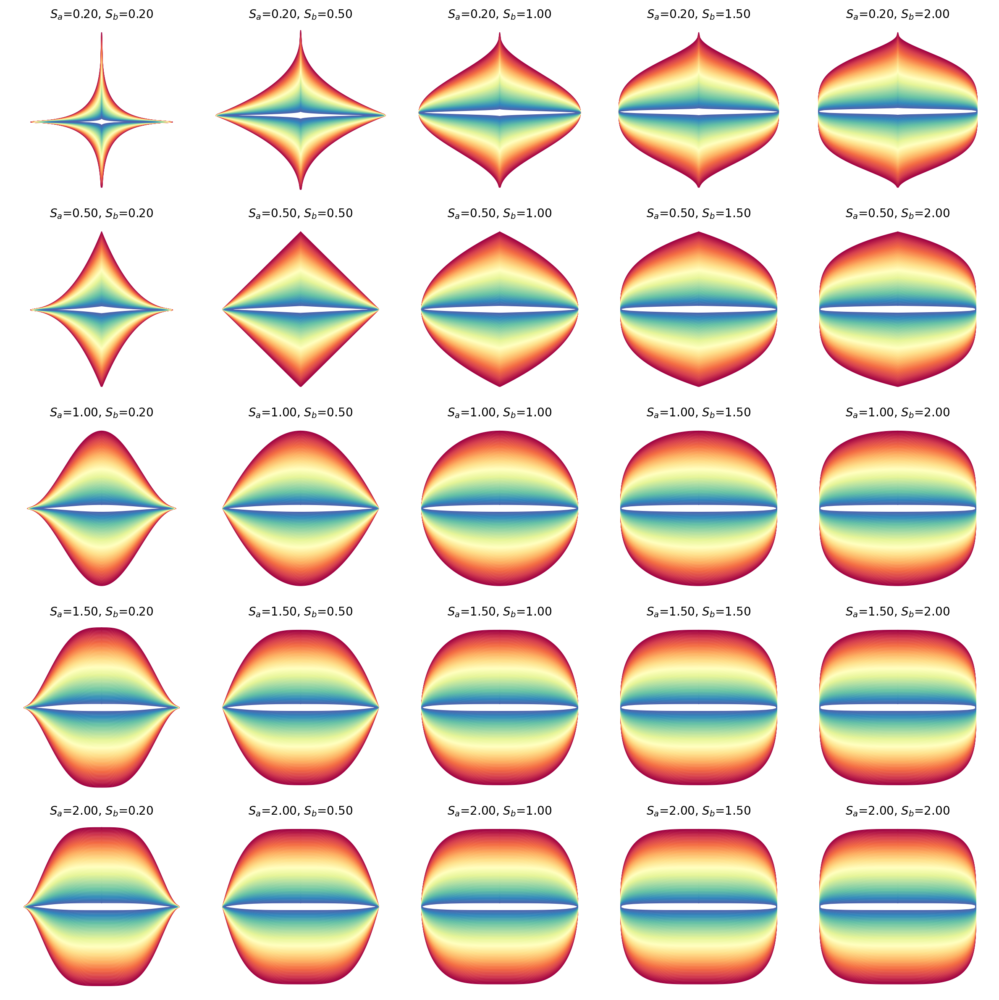

In [5]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import Normalize


s = [0.2,0.5,1,1.5,2]

fig, axes = plt.subplots(len(s), len(s), figsize=(12, 12), dpi=200)
norm = Normalize(0.01, 0.99)
cmap = plt.get_cmap('Spectral')

for i, sa in enumerate(s):
    for j, sb in enumerate(s):
        ax = axes[i, j]
        ax.axis('equal')
        shape.parameters['sa'] = sa
        shape.parameters['sb'] = sb
        for eps_ab in np.linspace(0.01, 0.95, 100):
            shape.parameters['eps_ab'] = eps_ab
            x, y = shape.generate_slice2D(500)
            ax.plot(x, y, c=cmap(norm(eps_ab)), linewidth=0.8)
        ax.set_title(f"$S_a$={sa:.2f}, $S_b$={sb:.2f}", fontsize=10)
        ax.axis('off')
plt.tight_layout()
plt.show()

## The Three-Dimensional Case

Using `generate_edge3D`, we can obtain the three-dimensional boundary of the ellipsoid and then visualize its shape with `plot_surface`.

### Effect of Ellipticity

The figure below shows how the ellipticities `eps_ab` and `eps_bc` affect the shape of a standard ellipsoid with `sa=sb=sc=1`.

Larger ellipticity values make the ellipsoid more flattened or elongated, while smaller values produce shapes that are closer to spherical.

Different combinations of ellipticity can therefore generate a wide range of shapes, including spheres, disk-like configurations, oblate ellipsoids, and prolate ellipsoids.

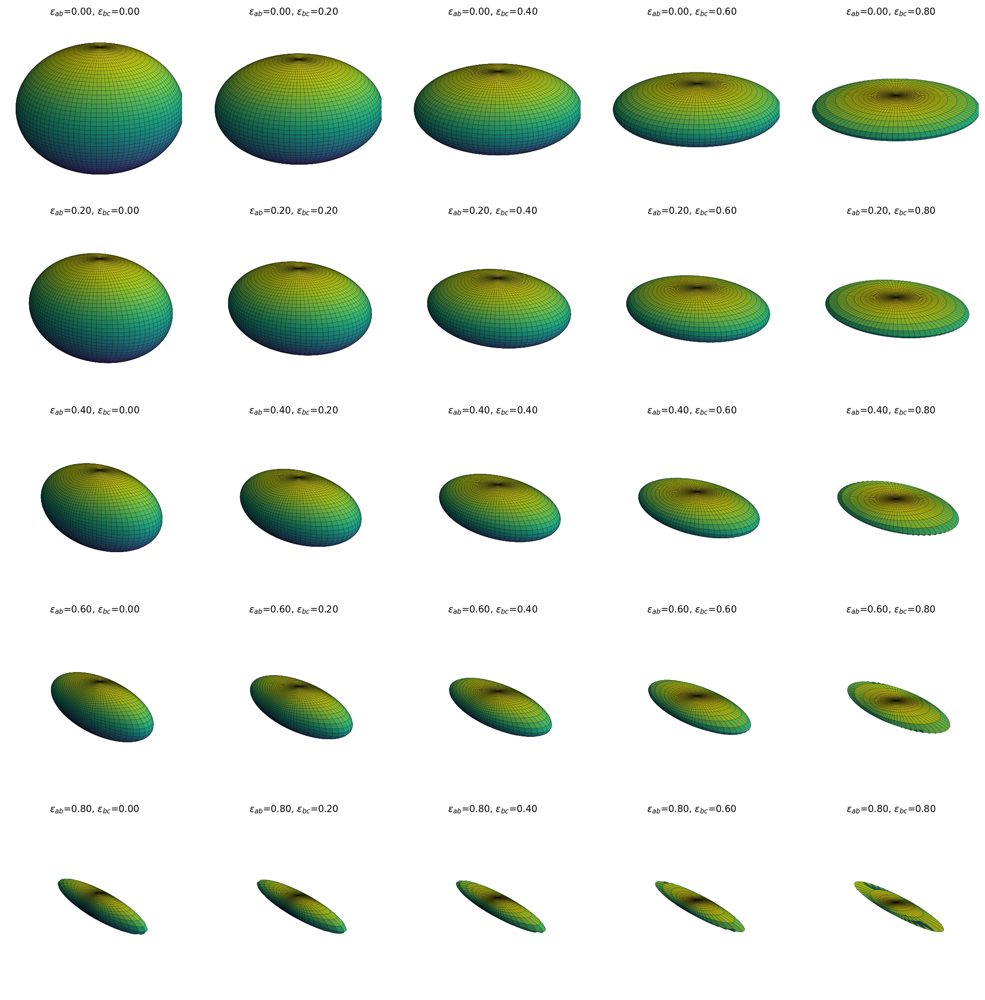

In [6]:
from matplotlib import cm

eps_ab_list = [0.,0.2,0.4,0.6,0.8]
eps_bc_list = [0.,0.2,0.4,0.6,0.8]
shape.parameters['sa'] = 1
shape.parameters['sb'] = 1
shape.parameters['sc'] = 1
shape.parameters['a'] = 10
fig = plt.figure(figsize=(15, 15), dpi=150)

for i, eps_ab in enumerate(eps_ab_list):
    for j, eps_bc in enumerate(eps_bc_list):
        ax = fig.add_subplot(len(eps_ab_list), len(eps_bc_list), i * len(eps_bc_list) + j + 1, projection='3d')
        shape.parameters['eps_ab'] = eps_ab
        shape.parameters['eps_bc'] = eps_bc
        X, Y, Z = shape.generate_edge3D(n_phi_bins=400,n_theta_bins=200)
        if i==0 and j == 0:
            x1,y1,z1=X,Y,Z
        norm = plt.Normalize(Z.min(), Z.max())
        colors = cm.viridis(norm(Z))  
        #ax.plot_surface(X, Y, Z, rstride=4, cstride=4, cmap='grey', linewidth=0.1, edgecolor='k', alpha=0.2)
        ax.plot_surface(X, Y, Z, facecolors=colors, rstride=4, cstride=4, linewidth=0.1, edgecolor='k', alpha=1)
        ax.set_title("$\epsilon_{ab}$="+f"{eps_ab:.2f}"+", $\epsilon_{bc}$="+f"{eps_bc:.2f}", fontsize=10)
        ax.axis('equal')
        ex = (-6.5,7)
        ax.set_xlim(*ex)
        ax.set_ylim(*ex)
        ax.set_zlim(*ex)
        ax.view_init(elev=20, azim=150)
        ax.axis('off')
plt.tight_layout()
plt.show()

### Effect of the Shape Indices

The figure below shows how the shape indices `sa` and `sb` affect the shape of the ellipsoid for fixed ellipticities `eps_ab=0.5` and `eps_bc=0.2`.

Larger shape-index values make the ellipsoid boxier.

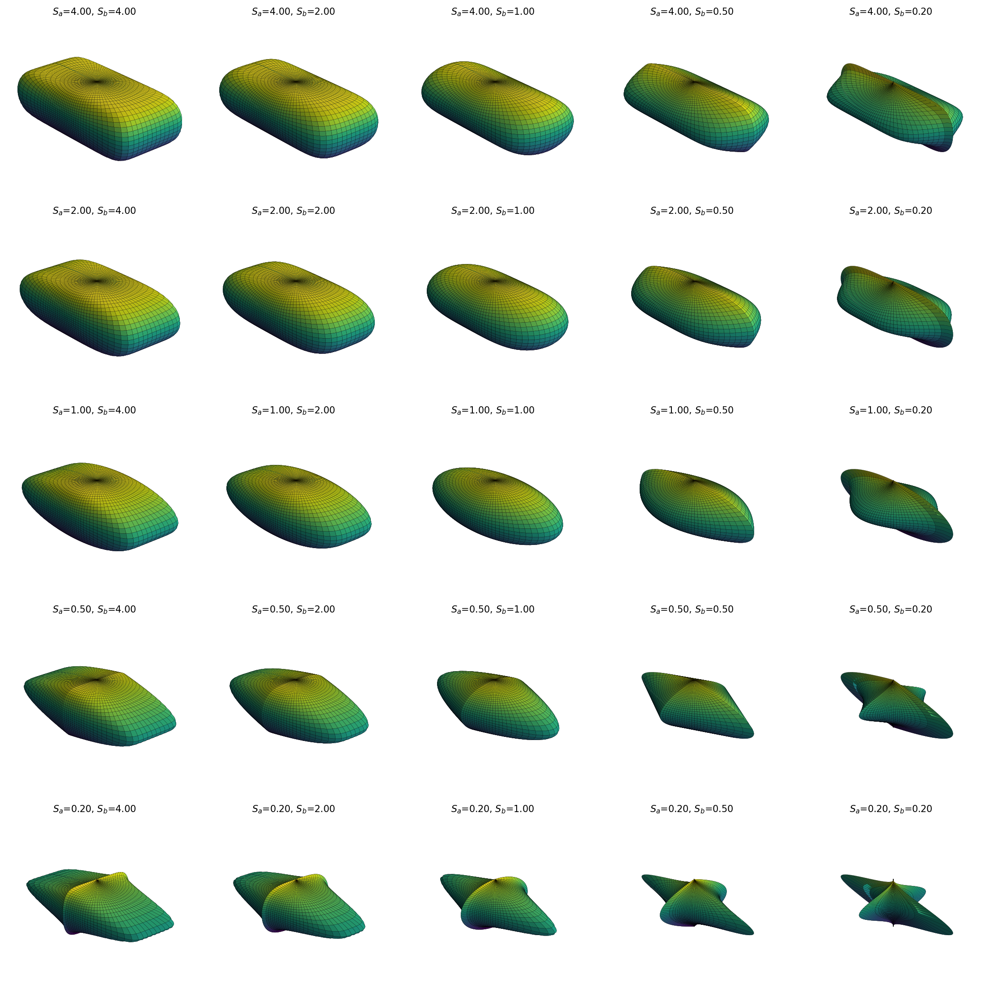

In [20]:
from matplotlib import cm

sa_list = [4,2,1,0.5,0.2]
sb_list = [4,2,1,0.5,0.2]
shape.parameters['eps_ab'] = 0.5
shape.parameters['eps_bc'] = 0.2
shape.parameters['a'] = 10
fig = plt.figure(figsize=(15, 15), dpi=150)

for i, sa in enumerate(sa_list):
    for j, sb in enumerate(sb_list):
        ax = fig.add_subplot(len(sa_list), len(sb_list), i * len(sb_list) + j + 1, projection='3d')
        shape.parameters['sa'] = sa
        shape.parameters['sb'] = sb
        X, Y, Z = shape.generate_edge3D(n_phi_bins=400,n_theta_bins=200)
        if i==0 and j == 0:
            x1,y1,z1=X,Y,Z
        norm = plt.Normalize(Z.min(), Z.max())
        colors = cm.viridis(norm(Z))  
        #ax.plot_surface(X, Y, Z, rstride=4, cstride=4, cmap='grey', linewidth=0.1, edgecolor='k', alpha=0.2)
        ax.plot_surface(X, Y, Z, facecolors=colors, rstride=4, cstride=4, linewidth=0.1, edgecolor='k', alpha=1)
        ax.set_title(f"$S_a$={sa:.2f}, $S_b$={sb:.2f}", fontsize=10)
        ax.axis('equal')
        ex = (-6.5,6.5)
        ax.set_xlim(*ex)
        ax.set_ylim(*ex)
        ax.set_zlim(*ex)
        ax.view_init(elev=25, azim=140)
        ax.axis('off')
plt.tight_layout()
plt.show()

### Other Parameter Combinations

With `sa=sb=sc=4`, vary `eps_ab` and `eps_bc`.

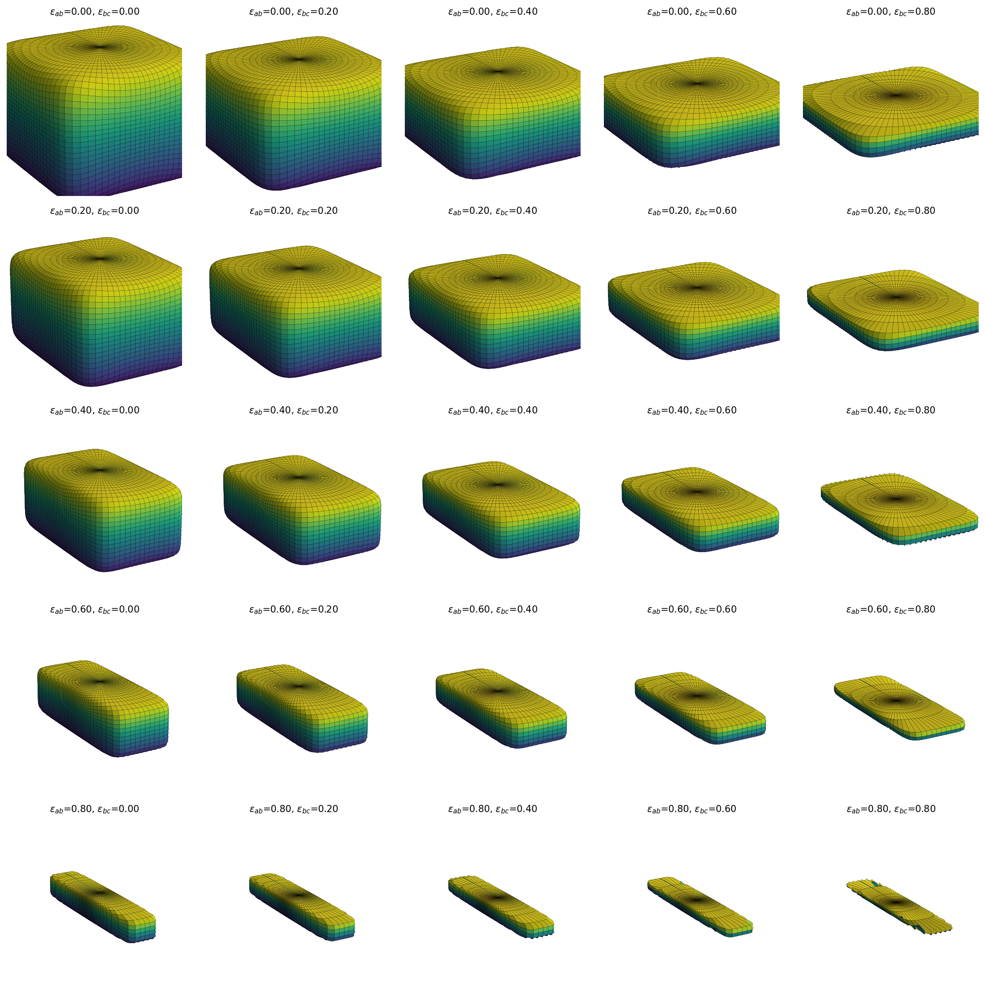

In [28]:
from matplotlib import cm

eps_ab_list = [0.,0.2,0.4,0.6,0.8]
eps_bc_list = [0.,0.2,0.4,0.6,0.8]
shape.parameters['sa'] = 4
shape.parameters['sb'] = 4
shape.parameters['sc'] = 4
shape.parameters['a'] = 10
fig = plt.figure(figsize=(15, 15), dpi=150)

for i, eps_ab in enumerate(eps_ab_list):
    for j, eps_bc in enumerate(eps_bc_list):
        ax = fig.add_subplot(len(eps_ab_list), len(eps_bc_list), i * len(eps_bc_list) + j + 1, projection='3d')
        shape.parameters['eps_ab'] = eps_ab
        shape.parameters['eps_bc'] = eps_bc
        X, Y, Z = shape.generate_edge3D(n_phi_bins=400,n_theta_bins=200)
        if i==0 and j == 0:
            x1,y1,z1=X,Y,Z
        norm = plt.Normalize(Z.min(), Z.max())
        colors = cm.viridis(norm(Z))  
        #ax.plot_surface(X, Y, Z, rstride=4, cstride=4, cmap='grey', linewidth=0.1, edgecolor='k', alpha=0.2)
        ax.plot_surface(X, Y, Z, facecolors=colors, rstride=4, cstride=4, linewidth=0.1, edgecolor='k', alpha=1)
        ax.set_title("$\epsilon_{ab}$="+f"{eps_ab:.2f}"+", $\epsilon_{bc}$="+f"{eps_bc:.2f}", fontsize=10)
        ax.axis('equal')
        ex = (-6.5,7)
        ax.set_xlim(*ex)
        ax.set_ylim(*ex)
        ax.set_zlim(*ex)
        ax.view_init(elev=20, azim=150)
        ax.axis('off')
plt.tight_layout()
plt.show()

With `sa=sb=0.5` and `sc=1`, vary `eps_ab` and `eps_bc`.

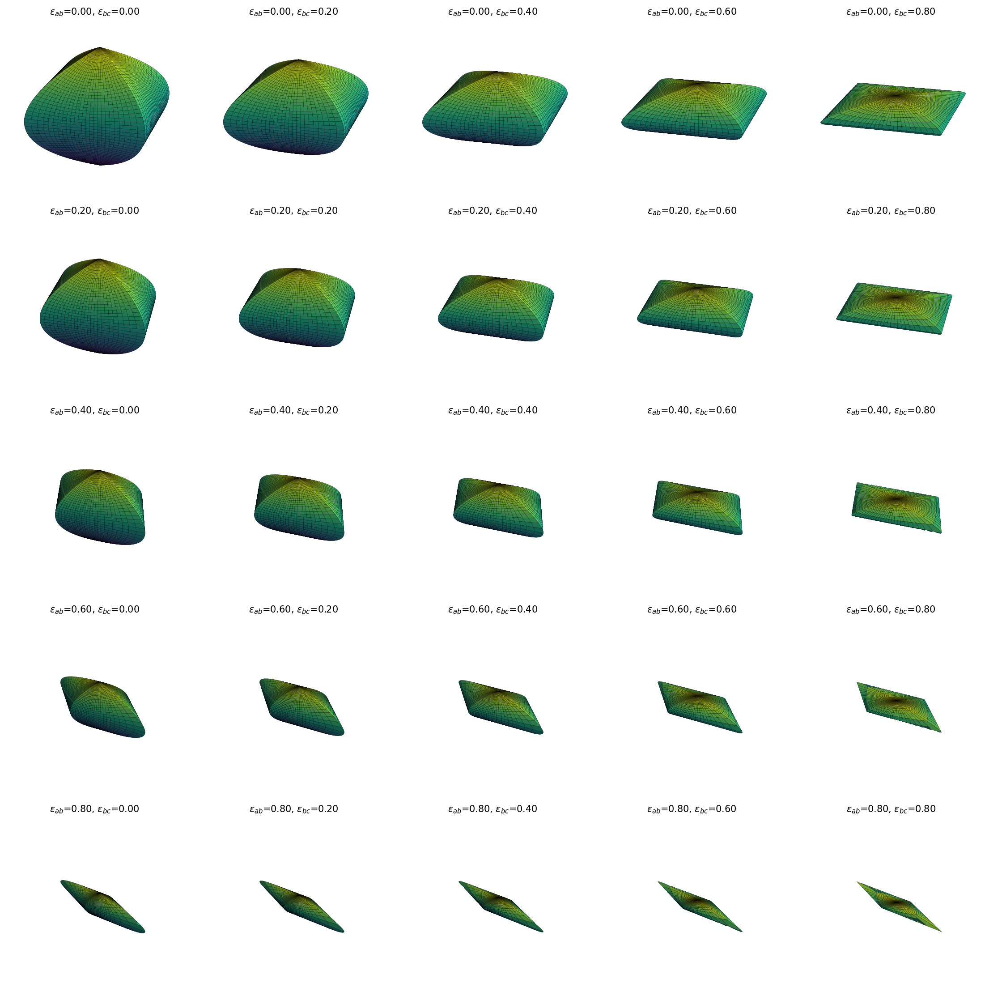

In [29]:
from matplotlib import cm

eps_ab_list = [0.,0.2,0.4,0.6,0.8]
eps_bc_list = [0.,0.2,0.4,0.6,0.8]
shape.parameters['sa'] = 0.5
shape.parameters['sb'] = 0.5
shape.parameters['sc'] = 1
shape.parameters['a'] = 10
fig = plt.figure(figsize=(15, 15), dpi=150)

for i, eps_ab in enumerate(eps_ab_list):
    for j, eps_bc in enumerate(eps_bc_list):
        ax = fig.add_subplot(len(eps_ab_list), len(eps_bc_list), i * len(eps_bc_list) + j + 1, projection='3d')
        shape.parameters['eps_ab'] = eps_ab
        shape.parameters['eps_bc'] = eps_bc
        X, Y, Z = shape.generate_edge3D(n_phi_bins=400,n_theta_bins=200)
        if i==0 and j == 0:
            x1,y1,z1=X,Y,Z
        norm = plt.Normalize(Z.min(), Z.max())
        colors = cm.viridis(norm(Z))  
        #ax.plot_surface(X, Y, Z, rstride=4, cstride=4, cmap='grey', linewidth=0.1, edgecolor='k', alpha=0.2)
        ax.plot_surface(X, Y, Z, facecolors=colors, rstride=4, cstride=4, linewidth=0.1, edgecolor='k', alpha=1)
        ax.set_title("$\epsilon_{ab}$="+f"{eps_ab:.2f}"+", $\epsilon_{bc}$="+f"{eps_bc:.2f}", fontsize=10)
        ax.axis('equal')
        ex = (-6.5,7)
        ax.set_xlim(*ex)
        ax.set_ylim(*ex)
        ax.set_zlim(*ex)
        ax.view_init(elev=20, azim=150)
        ax.axis('off')
plt.tight_layout()
plt.show()

With `sa=0.5`, `sb=2`, and `sc=1`, vary `eps_ab` and `eps_bc`.

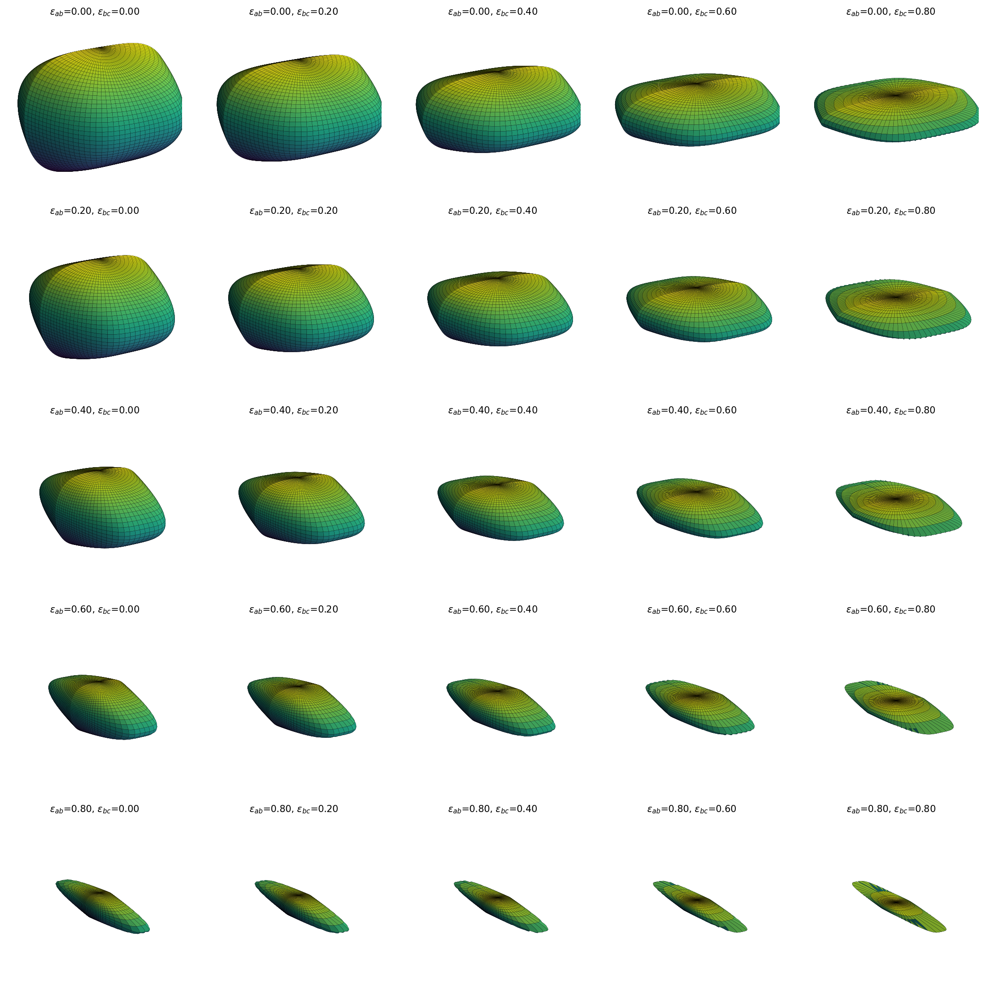

In [30]:
from matplotlib import cm

eps_ab_list = [0.,0.2,0.4,0.6,0.8]
eps_bc_list = [0.,0.2,0.4,0.6,0.8]
shape.parameters['sa'] = 0.5
shape.parameters['sb'] = 2
shape.parameters['sc'] = 1
shape.parameters['a'] = 10
fig = plt.figure(figsize=(15, 15), dpi=150)

for i, eps_ab in enumerate(eps_ab_list):
    for j, eps_bc in enumerate(eps_bc_list):
        ax = fig.add_subplot(len(eps_ab_list), len(eps_bc_list), i * len(eps_bc_list) + j + 1, projection='3d')
        shape.parameters['eps_ab'] = eps_ab
        shape.parameters['eps_bc'] = eps_bc
        X, Y, Z = shape.generate_edge3D(n_phi_bins=400,n_theta_bins=200)
        if i==0 and j == 0:
            x1,y1,z1=X,Y,Z
        norm = plt.Normalize(Z.min(), Z.max())
        colors = cm.viridis(norm(Z))  
        #ax.plot_surface(X, Y, Z, rstride=4, cstride=4, cmap='grey', linewidth=0.1, edgecolor='k', alpha=0.2)
        ax.plot_surface(X, Y, Z, facecolors=colors, rstride=4, cstride=4, linewidth=0.1, edgecolor='k', alpha=1)
        ax.set_title("$\epsilon_{ab}$="+f"{eps_ab:.2f}"+", $\epsilon_{bc}$="+f"{eps_bc:.2f}", fontsize=10)
        ax.axis('equal')
        ex = (-6.5,7)
        ax.set_xlim(*ex)
        ax.set_ylim(*ex)
        ax.set_zlim(*ex)
        ax.view_init(elev=20, azim=150)
        ax.axis('off')
plt.tight_layout()
plt.show()


With `sa=2`, `sb=0.5`, and `sc=1`, vary `eps_ab` and `eps_bc`.

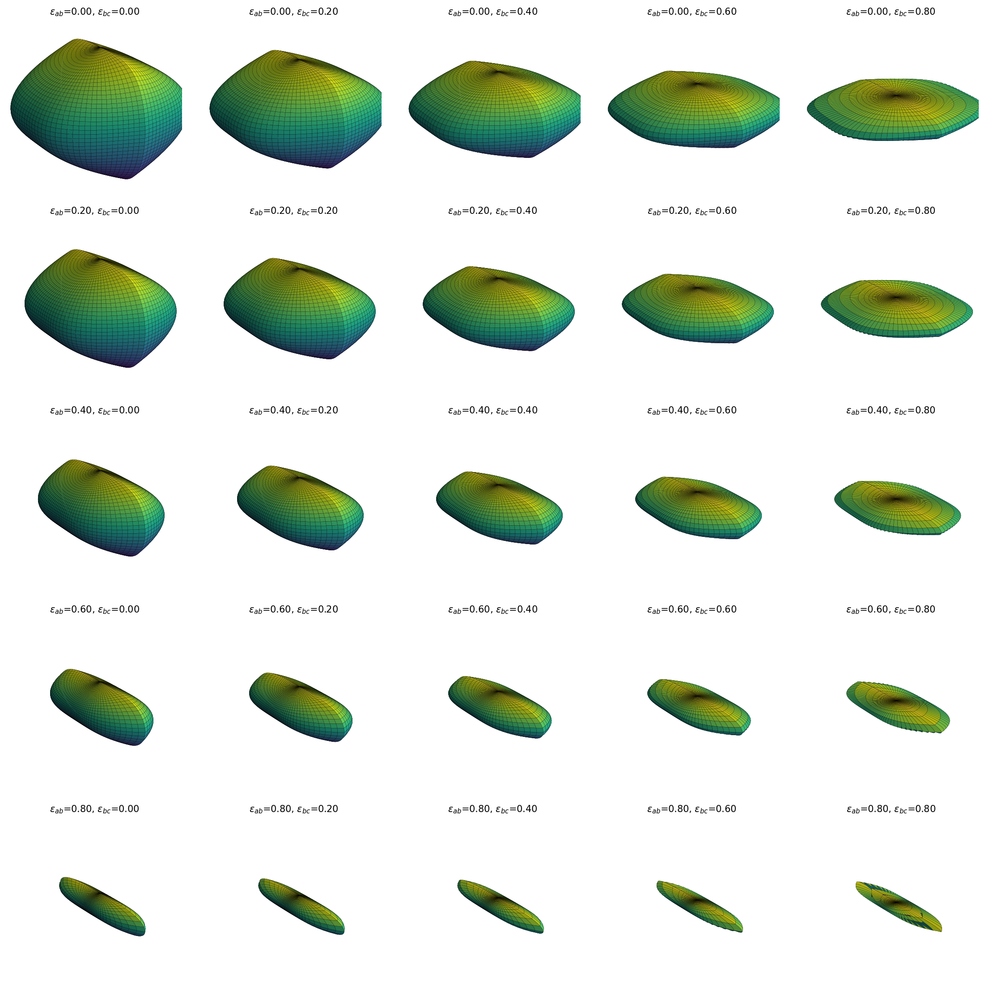

In [31]:
from matplotlib import cm

eps_ab_list = [0.,0.2,0.4,0.6,0.8]
eps_bc_list = [0.,0.2,0.4,0.6,0.8]
shape.parameters['sa'] = 2
shape.parameters['sb'] = 0.5
shape.parameters['sc'] = 1
shape.parameters['a'] = 10
fig = plt.figure(figsize=(15, 15), dpi=150)

for i, eps_ab in enumerate(eps_ab_list):
    for j, eps_bc in enumerate(eps_bc_list):
        ax = fig.add_subplot(len(eps_ab_list), len(eps_bc_list), i * len(eps_bc_list) + j + 1, projection='3d')
        shape.parameters['eps_ab'] = eps_ab
        shape.parameters['eps_bc'] = eps_bc
        X, Y, Z = shape.generate_edge3D(n_phi_bins=400,n_theta_bins=200)
        if i==0 and j == 0:
            x1,y1,z1=X,Y,Z
        norm = plt.Normalize(Z.min(), Z.max())
        colors = cm.viridis(norm(Z))  
        #ax.plot_surface(X, Y, Z, rstride=4, cstride=4, cmap='grey', linewidth=0.1, edgecolor='k', alpha=0.2)
        ax.plot_surface(X, Y, Z, facecolors=colors, rstride=4, cstride=4, linewidth=0.1, edgecolor='k', alpha=1)
        ax.set_title("$\epsilon_{ab}$="+f"{eps_ab:.2f}"+", $\epsilon_{bc}$="+f"{eps_bc:.2f}", fontsize=10)
        ax.axis('equal')
        ex = (-6.5,7)
        ax.set_xlim(*ex)
        ax.set_ylim(*ex)
        ax.set_zlim(*ex)
        ax.view_init(elev=20, azim=150)
        ax.axis('off')
plt.tight_layout()
plt.show()